# show head for MPII dataset
## To-do:
### construct one data and show it
### output all head data to a CSV file

In [25]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
from __future__ import unicode_literals
from scipy.io import loadmat
izip = zip
import json
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
%matplotlib inline

In [4]:
MPII_DATA_DIR = "../deeppose_tf/datasets/mpii"
mat = loadmat(os.path.join(MPII_DATA_DIR, 'mpii_human_pose_v1_u12_1.mat'))


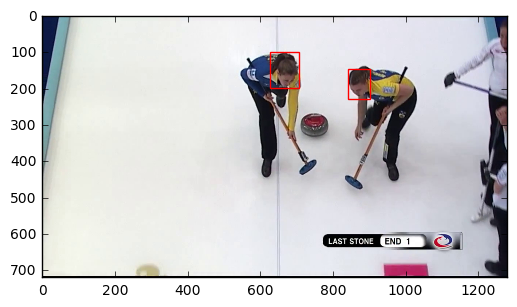

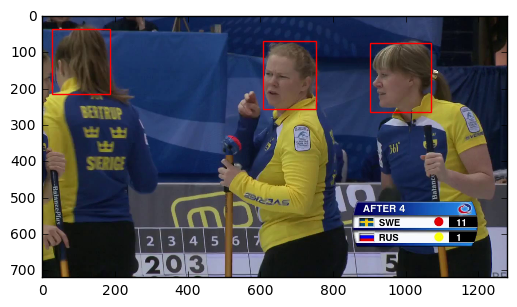

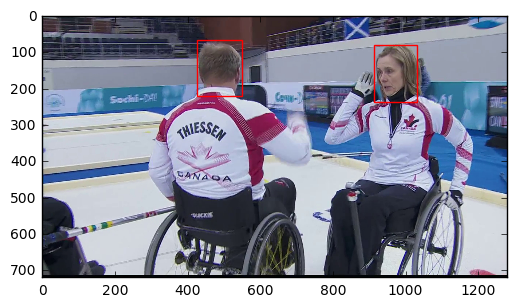

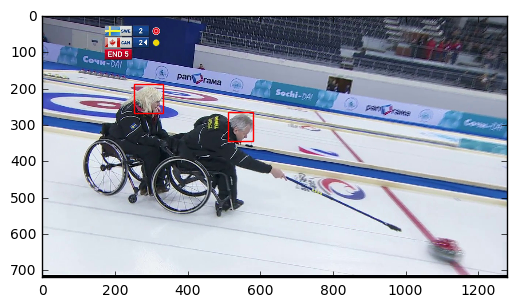

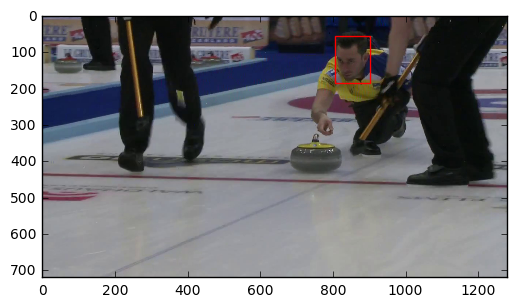

...

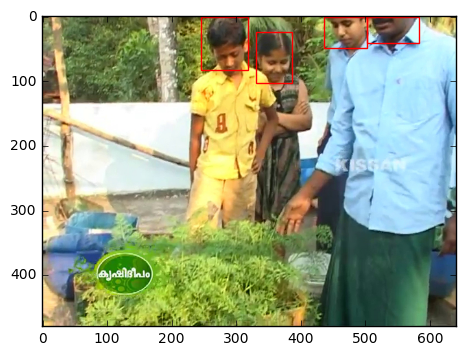

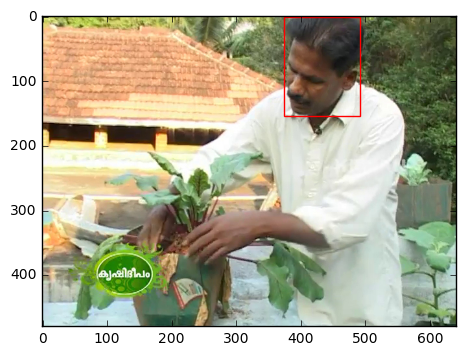

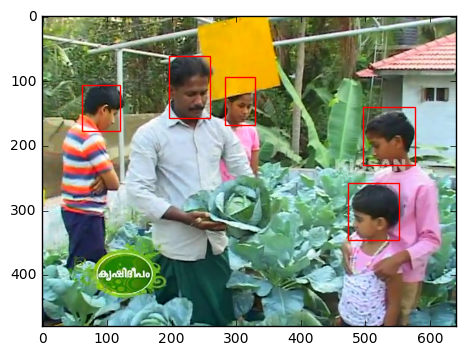

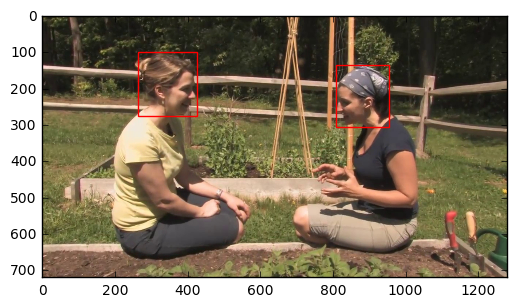

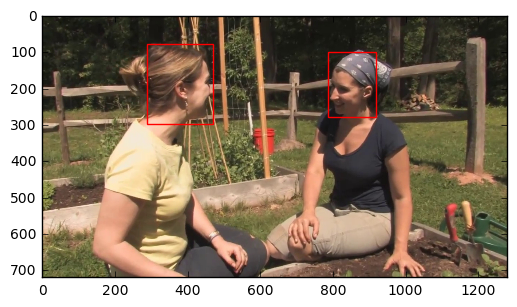

In [ ]:
showed = 0
for i, (anno, train_flag) in enumerate(
    izip(mat['RELEASE']['annolist'][0, 0][0],
         mat['RELEASE']['img_train'][0, 0][0])):
    img_fn = anno['image']['name'][0,0][0]
    file_img = os.path.join(MPII_DATA_DIR,'images',img_fn)
    #print(file_img)
    #if i==0:
    if showed < 100:
        if 'annopoints' in str(anno['annorect'].dtype):
            annopoints = anno['annorect']['annopoints'][0]
            head_x1s = anno['annorect']['x1'][0]
            head_y1s = anno['annorect']['y1'][0]
            head_x2s = anno['annorect']['x2'][0]
            head_y2s = anno['annorect']['y2'][0]
            fig,ax = plt.subplots(1)
            plt.imshow(mpimg.imread(file_img))
            for annopoint, head_x1, head_y1, head_x2, head_y2 in \
                    izip(annopoints, head_x1s, head_y1s, head_x2s, head_y2s):
                if len(annopoint) > 0:
                    head_rect = [float(head_x1[0, 0]),
                                 float(head_y1[0, 0]),
                                 float(head_x2[0, 0]),
                                 float(head_y2[0, 0])]
                    
                    rect = patches.Rectangle((head_rect[0],head_rect[1]),head_rect[2]-head_rect[0],head_rect[3]-head_rect[1],\
                                             linewidth=1,edgecolor='r',facecolor='none')
                    ax.add_patch(rect)
                    showed += 1
            plt.show()
    
